## <font color = yellow>Chapter 06 Singular Value Decomposition(SVD)

## <font color = yellow>I.) SVD

Single Value Decomposition (SVD) is a matrix factorization technique that decomposes a matrix into three matrices: U, Σ, and V.

Here's how it works:

Given an m x n matrix A, SVD factorizes A into three matrices:

$ A $ = $U $Σ $V^T $

where U is an m x m orthogonal matrix, Σ is an m x n diagonal matrix with non-negative real numbers on the diagonal, and V is an n x n orthogonal matrix.<br>
The values on the diagonal of Σ are known as singular values, and they represent the amount of variation in the data that is captured by each principal component. The columns of U and V are called left and right singular vectors, respectively, and they represent the directions in which the data varies the most.<br>
SVD has many applications, including image compression, recommender systems, and feature extraction. It is often used in machine learning algorithms such as Principal Component Analysis (PCA) and latent semantic analysis (LSA).

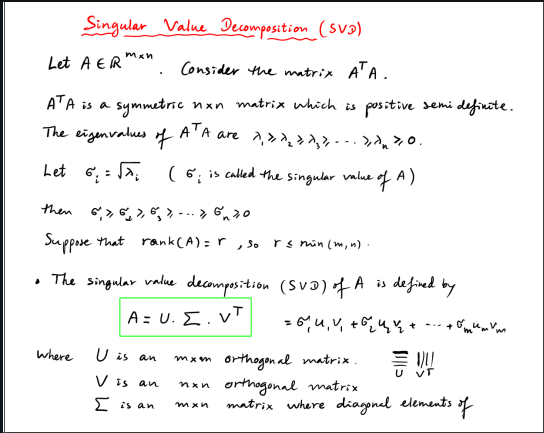

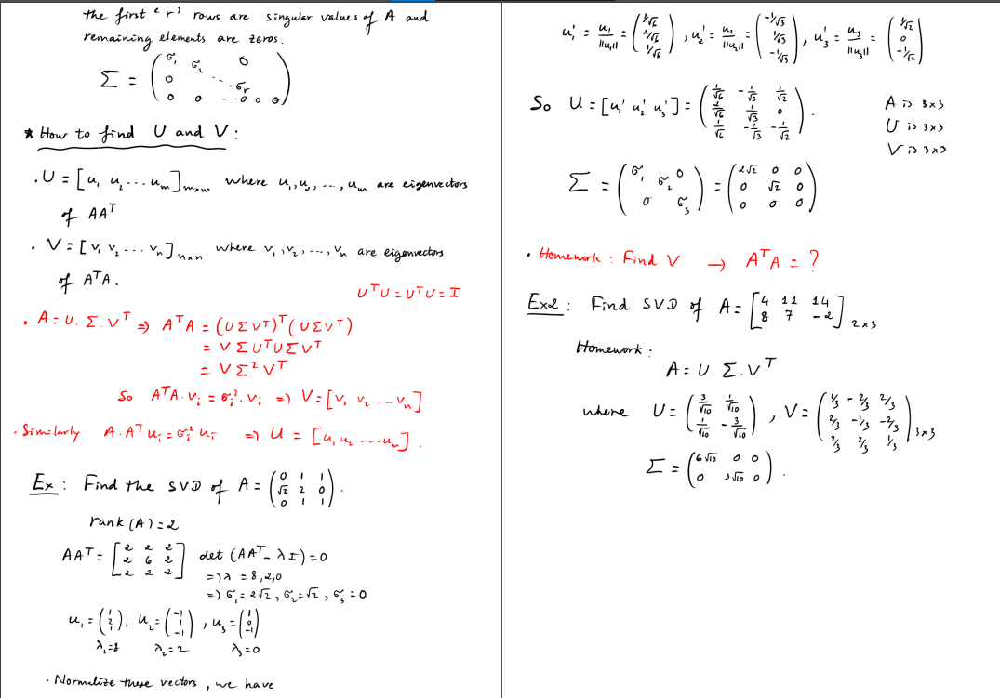

In [1]:
import numpy as np
from scipy.linalg import svd

##### <font color = yellow>Exercise 01

In [2]:
A1 = np.array([[1,2,3],
               [4,5,6],
               [7,8,9]])

# factorize
U1,S1,VT1 = svd(A1)

# n x n sigma matrix
Sigma1 = np.diag(S1)

In [3]:
U1

array([[-0.21483724,  0.88723069,  0.40824829],
       [-0.52058739,  0.24964395, -0.81649658],
       [-0.82633754, -0.38794278,  0.40824829]])

In [4]:
Sigma1

array([[1.68481034e+01, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 1.06836951e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 4.41842475e-16]])

In [5]:
VT1

array([[-0.47967118, -0.57236779, -0.66506441],
       [-0.77669099, -0.07568647,  0.62531805],
       [-0.40824829,  0.81649658, -0.40824829]])

In [6]:
# reconstruct A1
A1_2 = U1.dot(Sigma1.dot(VT1))
A1_2

array([[1., 2., 3.],
       [4., 5., 6.],
       [7., 8., 9.]])

##### <font color = yellow>Exercise 02

In [7]:
A2 = np.array([[0,1,1],[1.4142135623730951,2,0],[0,1,1]])
A2

array([[0.        , 1.        , 1.        ],
       [1.41421356, 2.        , 0.        ],
       [0.        , 1.        , 1.        ]])

In [8]:
U2,S2,VT2 = svd(A2)
Sigma2 = np.diag(S2)
U2

array([[-0.40824829,  0.57735027, -0.70710678],
       [-0.81649658, -0.57735027,  0.        ],
       [-0.40824829,  0.57735027,  0.70710678]])

In [9]:
Sigma2

array([[ 2.82842712,  0.        ,  0.        ],
       [ 0.        ,  1.41421356,  0.        ],
       [ 0.        ,  0.        , -0.        ]])

In [10]:
VT2

array([[-4.08248290e-01, -8.66025404e-01, -2.88675135e-01],
       [-5.77350269e-01, -4.89172797e-17,  8.16496581e-01],
       [-7.07106781e-01,  5.00000000e-01, -5.00000000e-01]])

In [11]:
# Reconstruct the matrix 
A2_2 = U2.dot(Sigma2.dot(VT2))
A2_2.astype(float)

array([[-2.20098361e-16,  1.00000000e+00,  1.00000000e+00],
       [ 1.41421356e+00,  2.00000000e+00, -2.33327555e-16],
       [-1.23841265e-16,  1.00000000e+00,  1.00000000e+00]])

## <font color = yellow>II.) Image Processing

#### <font color = yellow>Exercise 01:

In [14]:
import matplotlib.pyplot as plt
from PIL import Image 

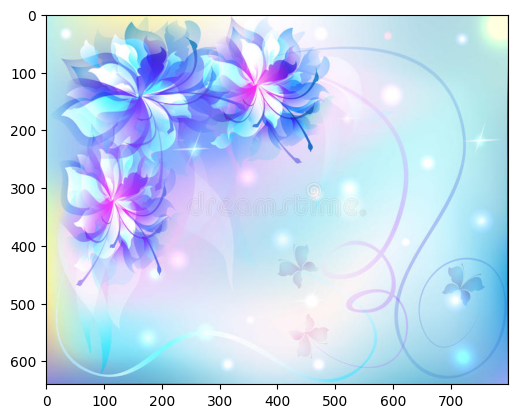

In [36]:
img1 = Image.open('pic1.jpg')
plt.imshow(img1)
plt.show()

In [37]:
img1.size

(800, 640)

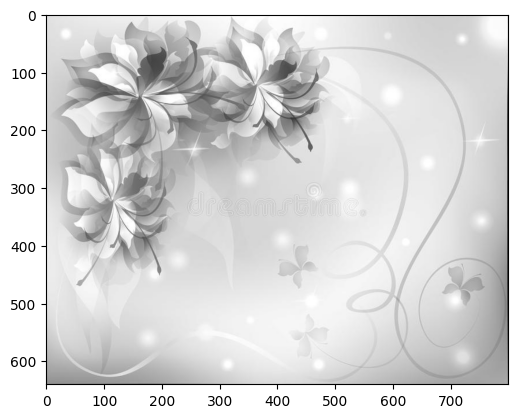

In [38]:
image_gray1 = img1.convert('LA')
plt.imshow(image_gray1)
plt.show()

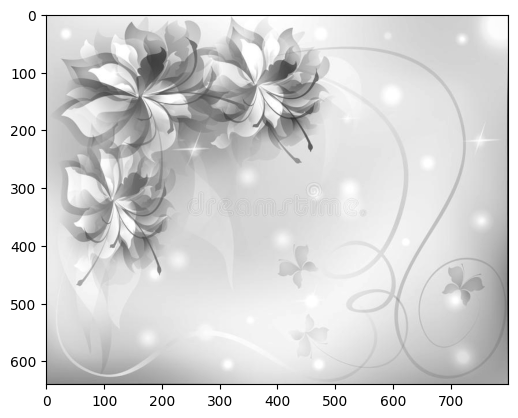

In [39]:
image_mat1 = np.array(list(image_gray1.getdata(band=0)),float)
image_mat1.shape = (image_gray1.size[1] ,image_gray1.size[0])
image_mat1 = np.matrix(image_mat1)
plt.imshow(image_mat1,cmap='gray')
plt.show()

In [150]:
# Calculate SVD of the image mat
U1, sigma1,VT1 = np.linalg.svd(image_mat1)

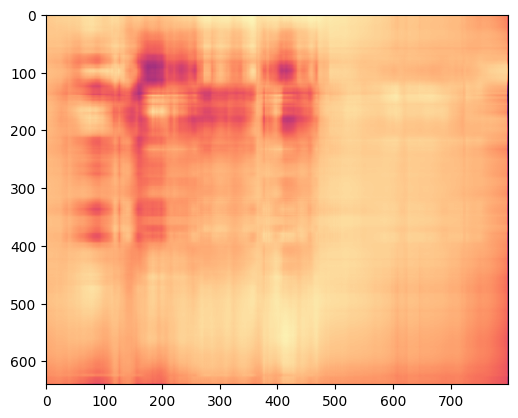

In [56]:
reconstruct_image1 = np.matrix(U1[:,:4]) * np.diag(sigma1[:4]) * np.matrix(VT1[:4,:])
plt.imshow(reconstruct_image1,cmap='magma')
plt.show()

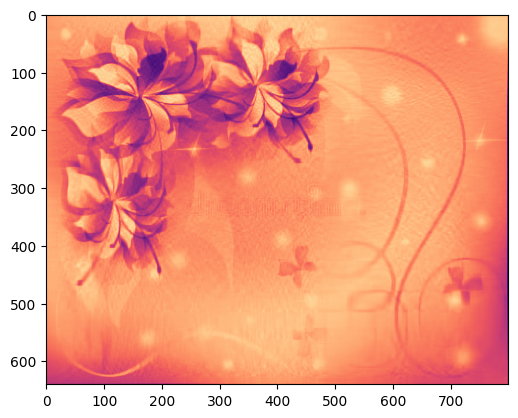

In [55]:
reconstruct_image1 = np.matrix(U1[:,:64]) * np.diag(sigma1[:64]) * np.matrix(VT1[:64,:])
plt.imshow(reconstruct_image1,cmap='magma')
plt.show()

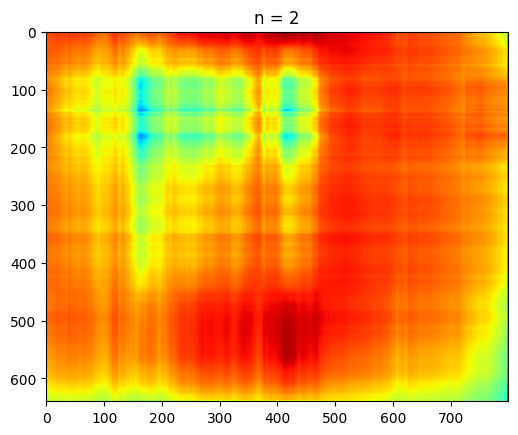

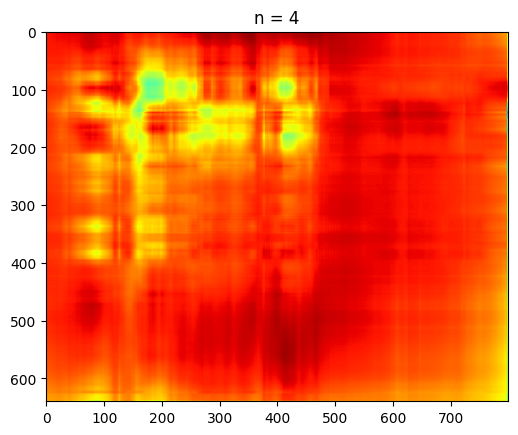

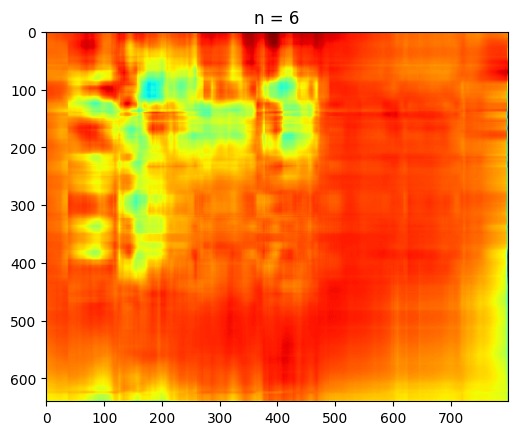

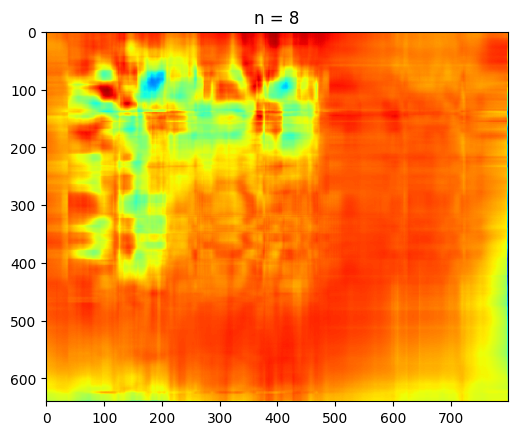

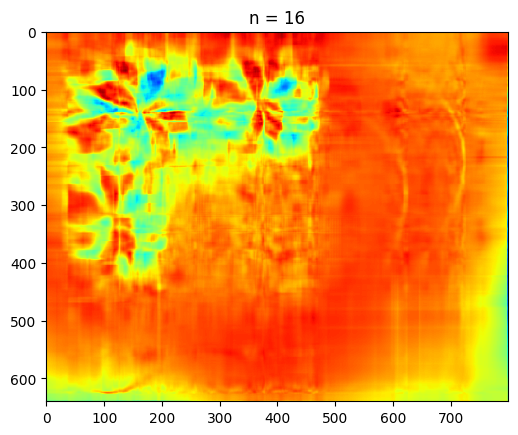

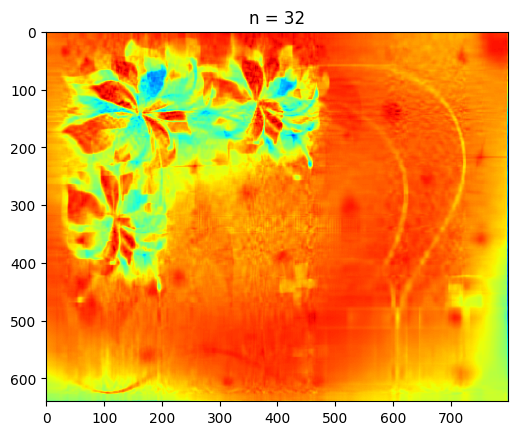

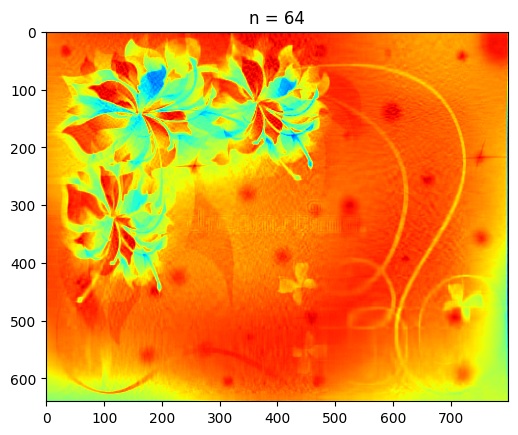

In [53]:
# Additional singular vectore improve the image quality
for i in [2,4,6,8,16,32,64]:
  reconstruct_image1 = np.matrix(U1[:,:i]) * np.diag(sigma1[:i]) * np.matrix(VT1[:i,:])
  plt.imshow(reconstruct_image1,cmap='jet')
  title = "n = %s" % i
  plt.title(title)
  plt.show()

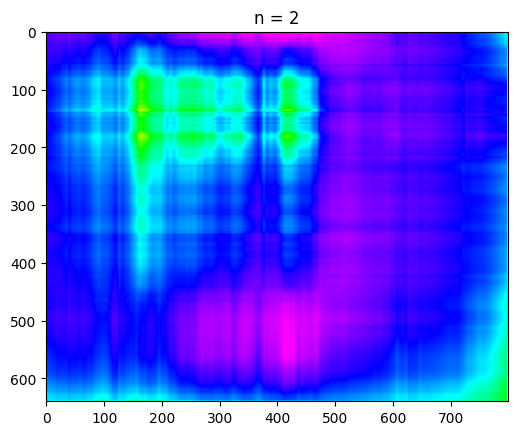

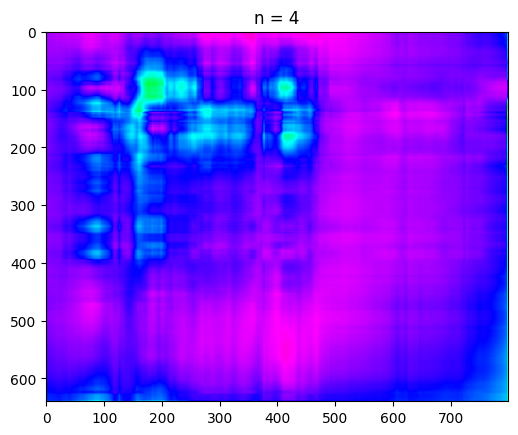

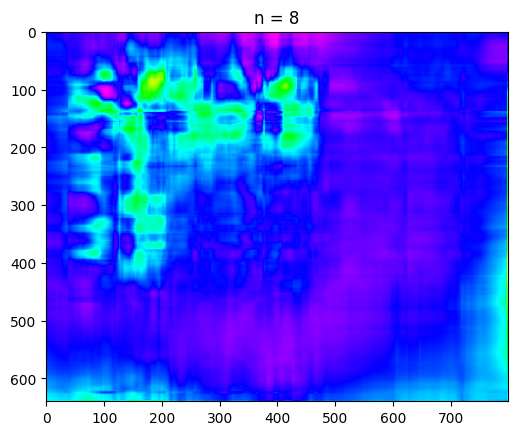

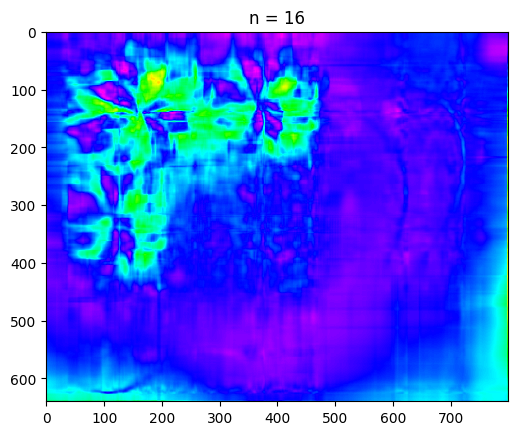

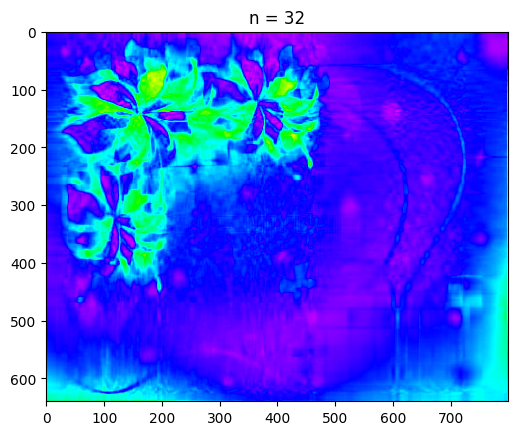

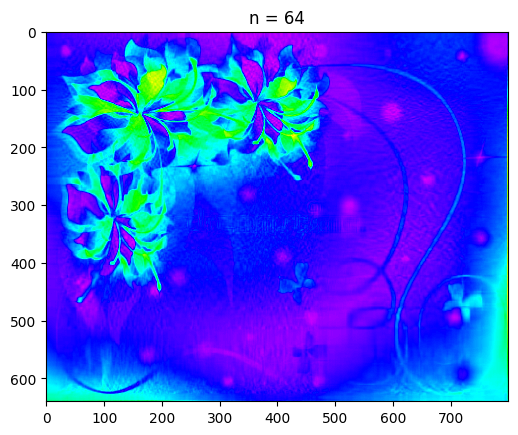

In [50]:
for i in [2,4,8,16,32,64]:
  reconstruct_image1 = np.matrix(U1[:,:i]) * np.diag(sigma1[:i]) * np.matrix(VT1[:i,:])
  plt.imshow(reconstruct_image1,cmap='gist_rainbow')
  title = "n = %s" % i
  plt.title(title)
  plt.show()

In [139]:
image_mat1.shape

(640, 800)

In [140]:
np.shape(img1)

(640, 800, 3)

In [142]:
full_representation1 = 640 * 640
full_representation1

409600

In [143]:
svd64_representation1 = 64*640 + 64 + 64*800
svd64_representation1

92224

In [144]:
svd64_representation1/full_representation1

0.22515625

In [146]:
percentage1 = svd64_representation1/full_representation1 * 100
percentage1

22.515625

<b>We use just 22.5156% of original image size. 

There are many different colormaps (cmap) available in matplotlib that can be used to display a color image. Here are some of the common colormaps and their descriptions:

- `'viridis'`: A perceptually uniform colormap that is often used to represent scientific data.

- `'plasma'`: Another perceptually uniform colormap that is similar to `viridis`, but with more contrast and brighter colors.

- `'magma'`: A colormap that transitions from black to white through a series of bright, rich colors.

- `'inferno'`: A colormap that transitions from yellow to red through shades of orange and purple.

- `'gist_rainbow'`: A rainbow colormap that transitions through all colors of the spectrum.

- `'jet'`: A rainbow colormap that has been widely used in scientific visualization, though it has fallen out of favor due to its poor perceptual properties.

- `'gray'`: A grayscale colormap that is commonly used to display black-and-white images.

These are just a few of the many colormaps available in matplotlib. You can find a complete list of the available colormaps in the [matplotlib documentation](https://matplotlib.org/stable/tutorials/colors/colormaps.html).

#### <font color = yellow>Exercise 02: 

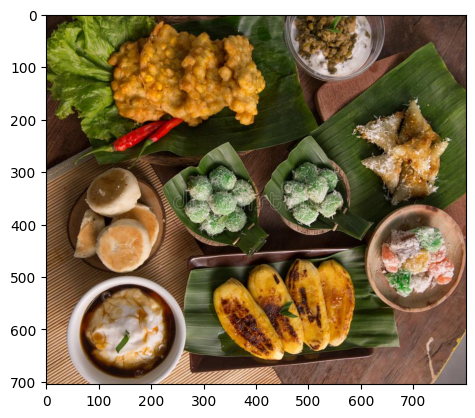

In [95]:
img2 = Image.open('pic2.jpg')
plt.imshow(img2)
plt.show()

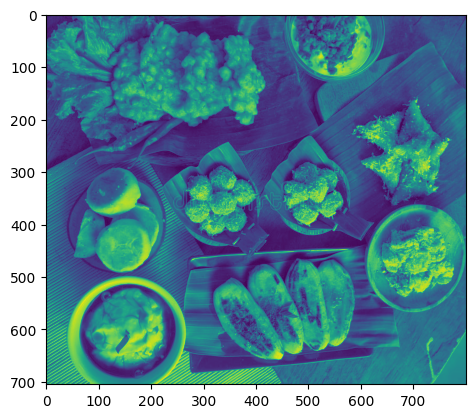

In [96]:
image_gray2 = img2.convert('L')
plt.imshow(image_gray2)
plt.show()

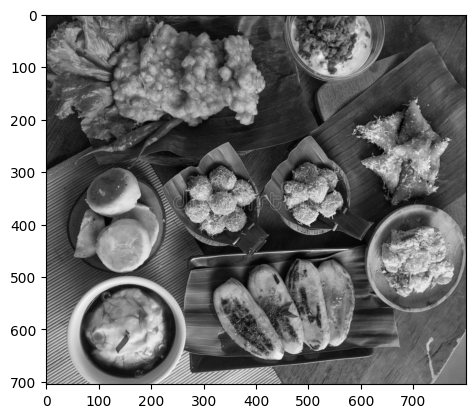

In [97]:
image_mat2 = np.array(list(image_gray2.getdata(band=0)),float)
image_mat2.shape = (image_gray2.size[1] ,image_gray2.size[0])
image_mat2 = np.matrix(image_mat2)
plt.imshow(image_mat2,cmap='gray')
plt.show()

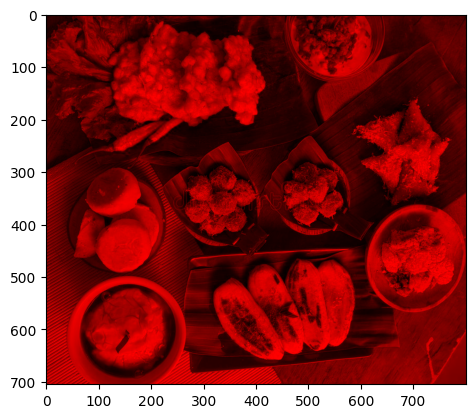

In [98]:
# Split the image into channels
r, g, b = img2.split()

# Discard the green and blue channels
r = r.convert('L')
g = Image.new("L", img2.size, 0)
b = Image.new("L", img2.size, 0)

# Merge the red channel with two blank channels for green and blue
redscale_img = Image.merge("RGB", (r, g, b))

# Show the redscale image
plt.imshow(redscale_img)
plt.show()

In [99]:
image_mat2.shape

(705, 800)

In [149]:
U2,sigma2,VT2 = np.linalg.svd(image_mat2)

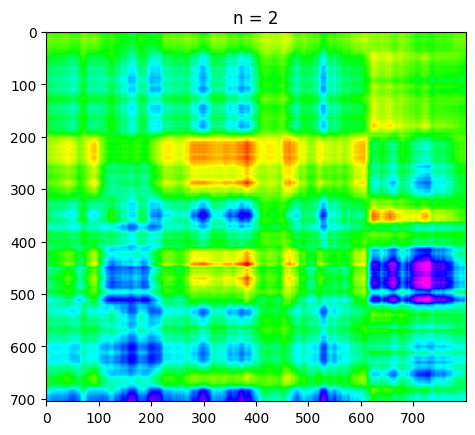

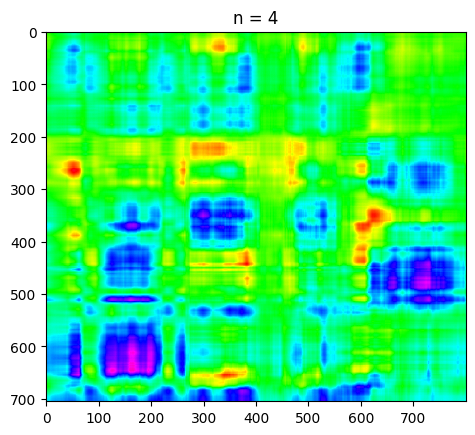

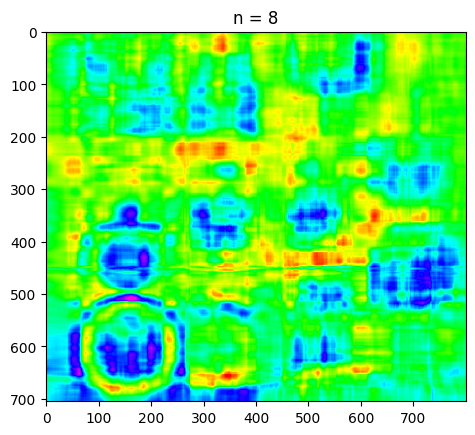

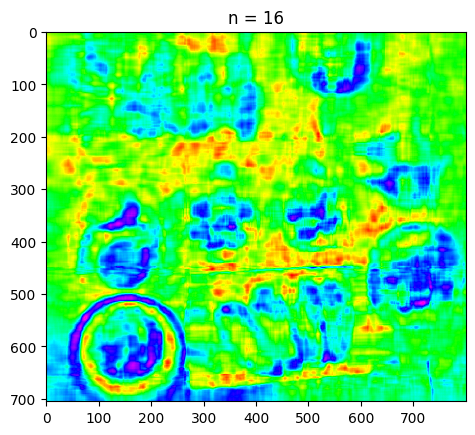

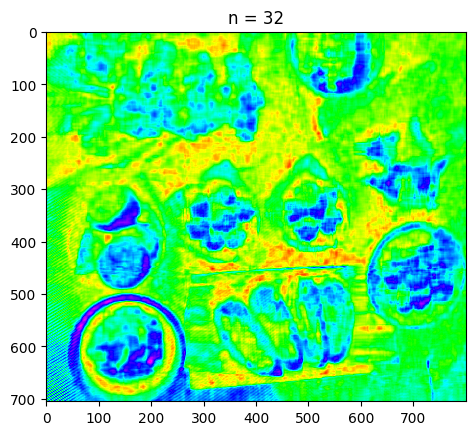

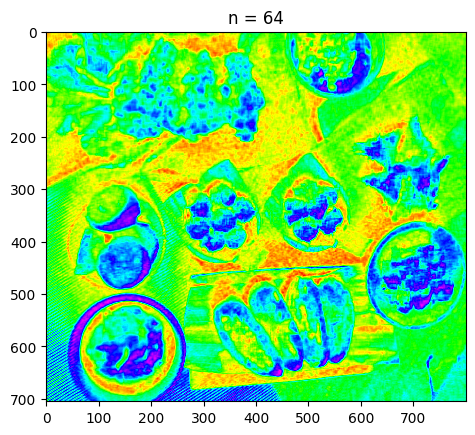

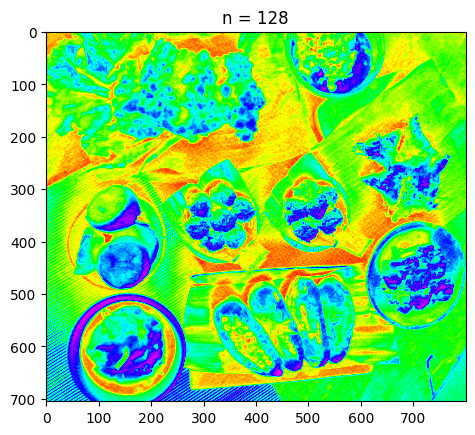

In [130]:
for i in [2,4,8,16,32,64,128]:
  reconstruct_image2 = np.matrix(U2[:,:i]) * np.diag(sigma2[:i]) * np.matrix(VT2[:i,:])
  plt.imshow(reconstruct_image2,cmap='gist_rainbow')
  title = "n = %s" % i
  plt.title(title)
  plt.show()

<font color = deeppink>We use just only 34.1787% of original image's size. So it is excellence to make dimensioality reduction

#### <font color = yellow> Exercise 03

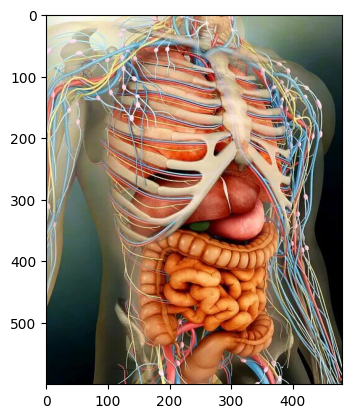

In [147]:
img3 = Image.open('pic3.jpg')
plt.imshow(img3)
plt.show()

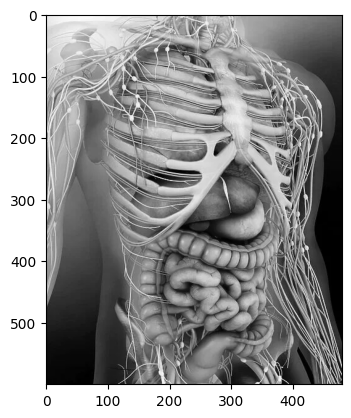

In [148]:
imggray3 = img3.convert('LA')
plt.imshow(imggray3)

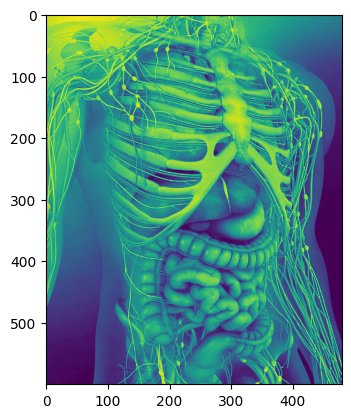

In [155]:
# convert to numpy data
imgmat3 = np.array(list(imggray3.getdata(band = 0)), float)
imgmat3.shape = (imggray3.size[1], imggray3.size[0])
imgmat3 = np.matrix(imgmat3)
plt.imshow(imgmat3)
plt.show()

In [158]:
# Calculate SVD of the image:
U3, sigma3, VT3 = np.linalg.svd(imgmat3)

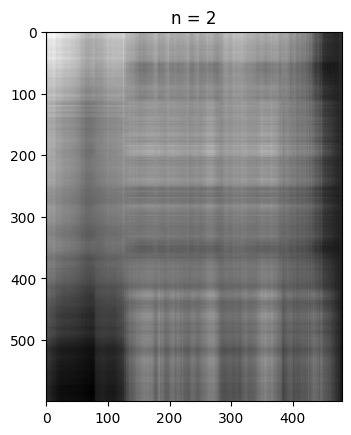

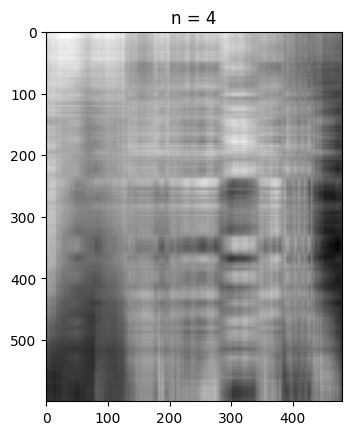

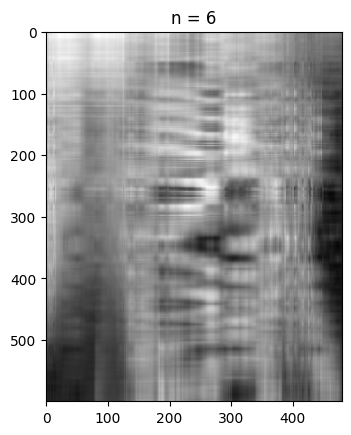

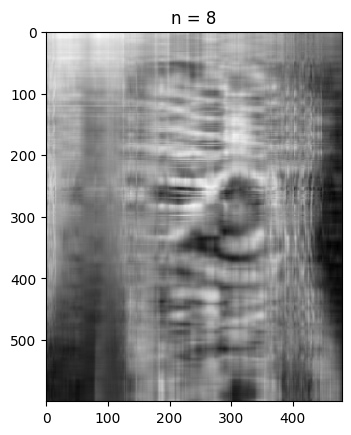

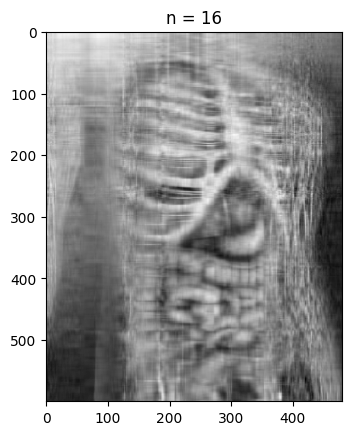

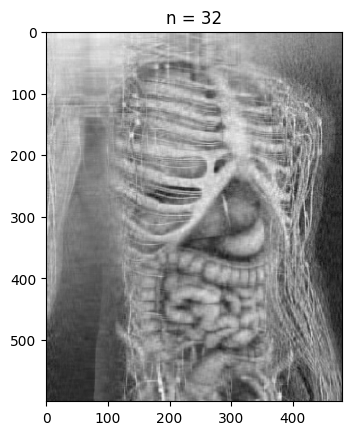

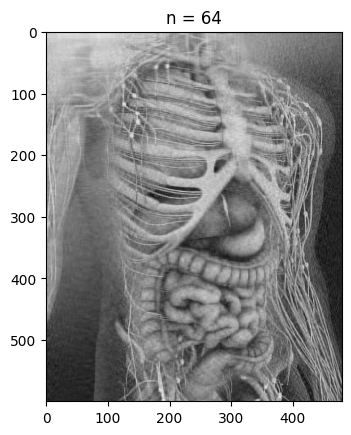

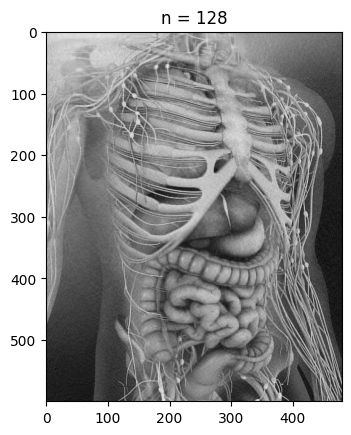

In [160]:
# Additional singular vector improve the image quality
for i in [2,4,6,8,16,32,64,128]:
    reconstruct_image3 = np.matrix(U3[:, :i])* np.diag(sigma3[:i])* np.matrix(VT3[:i, :])
    plt.imshow(reconstruct_image3, cmap = 'gray')
    title = "n = %s" % i
    plt.title(title)
    plt.show()

In [162]:
imgmat3.shape

(600, 480)

In [163]:
np.shape(imgmat3)

(600, 480)

In [164]:
full_representation3 = 600 * 480
full_representation3

288000

In [165]:
svd64_representation3 = 128*600 + 128 + 128*480
svd64_representation3

138368

In [166]:
svd64_representation3/full_representation3

0.48044444444444445

In [168]:
percentage3 = svd64_representation3/full_representation3 * 100
percentage3 

48.044444444444444

<b>We use just 48.0444% of original image's size 

#### <font color = yellow>Exercise 04

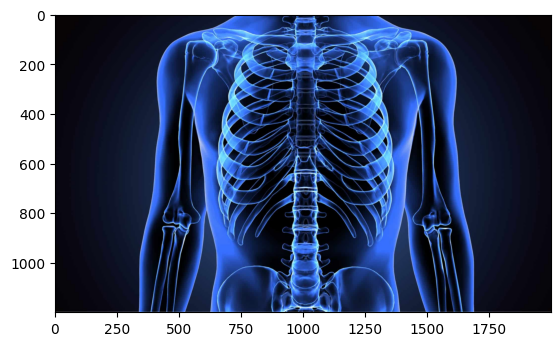

In [169]:
img4 = Image.open('pic4.jpg')
plt.imshow(img4)
plt.show()

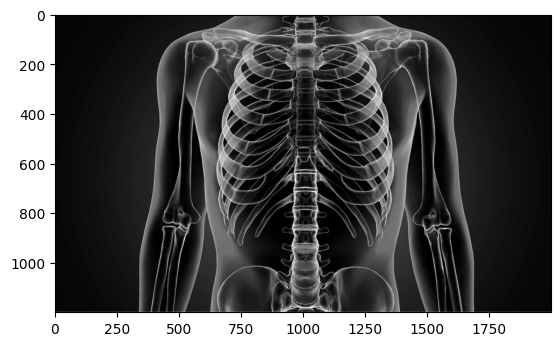

In [172]:
imggray4 = img4.convert('LA')
plt.imshow(imggray4)
plt.show()

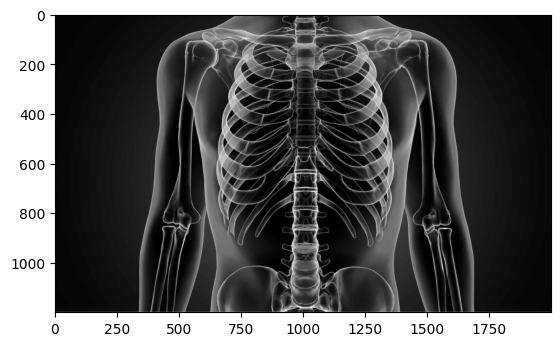

In [173]:
imgmat4 = np.array(list(imggray4.getdata(band = 0)), float)
imgmat4.shape = (imggray4.size[1], imggray4.size[0])
imgmat4 = np.matrix(imgmat4)
plt.imshow(imgmat4, cmap = 'gray')
plt.show()

In [174]:
# Calculate SVD of the image:
U4, sigma4, V4 = np.linalg.svd(imgmat4)

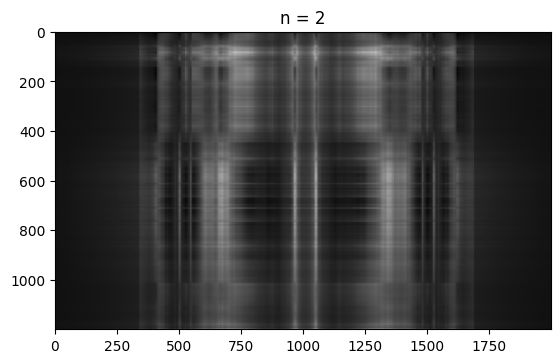

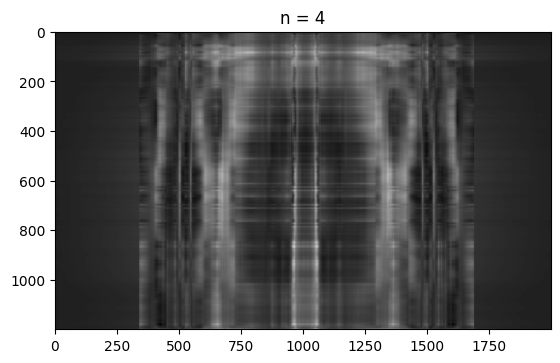

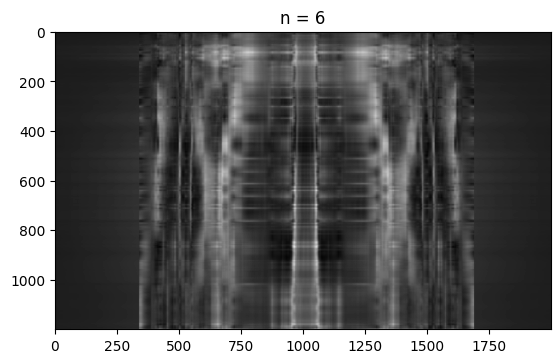

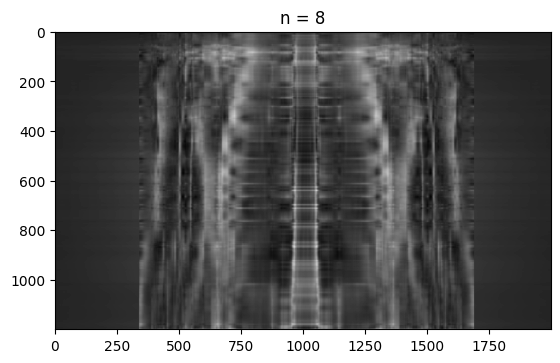

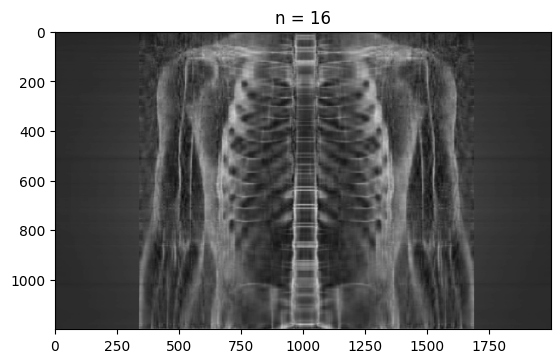

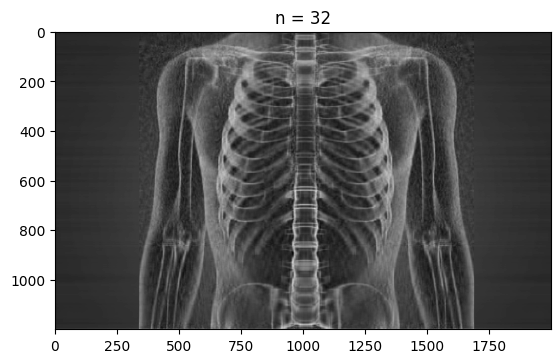

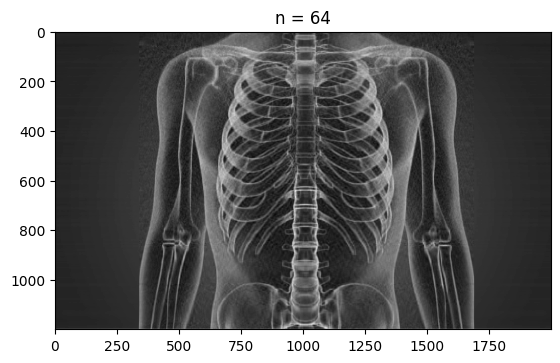

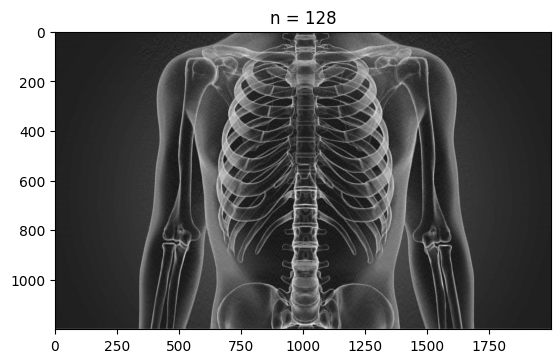

In [176]:
# Additional singular vector improve the image quality
for i in [2,4,6,8,16,32,64,128]:
    reconstimg = np.matrix(U4[:, :i])* np.diag(sigma4[:i])* np.matrix(V4[:i, :])
    plt.imshow(reconstimg, cmap = 'gray')
    title = "n = %s" % i
    plt.title(title)
    plt.show()

In [177]:
imgmat4.shape

(1200, 2000)

In [178]:
np.shape(img4)

(1200, 2000, 3)

In [180]:
full_representation4 = 1200*2000
full_representation4

2400000

In [181]:
svd64_representation4 = 128*1200 + 128 + 128*2000
svd64_representation4

409728

In [184]:
percentage4 = svd64_representation4/full_representation4 * 100
percentage4

17.072000000000003

<b>We use just only 17.072% of original image size 

## <font color = yellow>III.) Pseudoinverse</font>

<p>The pseudoinverse, also known as the Moore-Penrose inverse, is a generalization of the matrix inverse for non-square matrices. The pseudoinverse allows us to compute a "best-fit" solution to systems of linear equations, even when there is no exact solution.</p>

<p>For any matrix A, the pseudoinverse A+ satisfies the following four properties:</p>

<ol>
    <li>AA+A=A and A+A A=A.</li>
    <li>AA+ and A+A are both symmetric.</li>
    <li>If A has full rank, then A+ = (A<sup>T</sup>A)<sup>-1</sup>A<sup>T</sup>, which reduces to the usual matrix inverse formula when A is square and invertible.</li>
    <li>If A does not have full rank, then A+ minimizes ||Ax - b||<sub>2</sub> over all possible solutions x to the system Ax=b.</li>
</ol>

<p>The pseudoinverse is an incredibly useful tool in many areas of mathematics and science, including statistics, signal processing, control theory, and machine learning.</p>


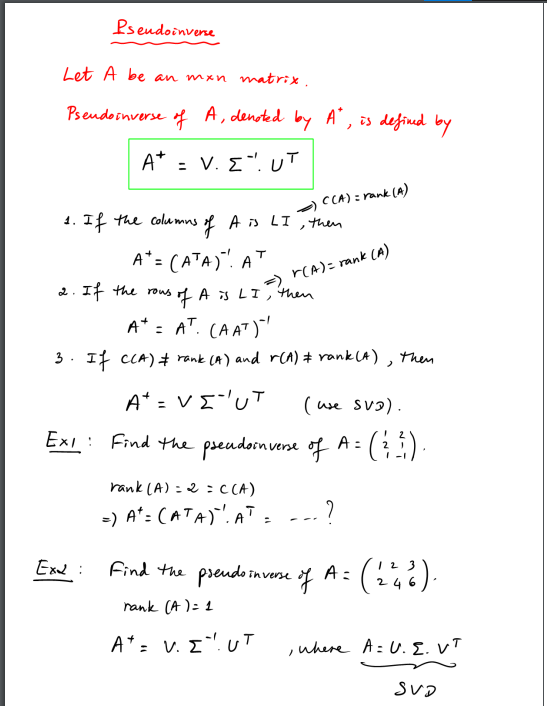

Let's calculate the pseudoinverse  𝐴+  of some matrix  𝐴  using the formula from the slides:

𝐴^+ =𝑉𝐷^{+}𝑈^𝑇

In [208]:
A = np.array([[-1,  2],
              [ 3, -2],
              [ 5,  7]])
np.linalg.pinv(A)

array([[-0.08767773,  0.17772512,  0.07582938],
       [ 0.07661927, -0.1192733 ,  0.08688784]])

In [210]:
A2 = np.array([[0,1,1],[1.4142135623730951,2,0],[0,1,1]])
np.linalg.pinv(A2)

array([[-0.1767767 ,  0.35355339, -0.1767767 ],
       [ 0.125     ,  0.25      ,  0.125     ],
       [ 0.375     , -0.25      ,  0.375     ]])

In [211]:
B1 = np.array([[-0.40824829,  0.57735027, -0.70710678],
               [-0.81649658, -0.57735027,  0.        ],
               [-0.40824829,  0.57735027,  0.70710678]])
np.linalg.pinv(B1)

array([[-0.40824829, -0.81649658, -0.40824829],
       [ 0.57735027, -0.57735027,  0.57735027],
       [-0.70710678,  0.        ,  0.70710678]])

In [212]:
B2 = np.array([[ 0.12708324,  0.47409506,  0.87125411],
       [ 0.00164602, -0.87847553,  0.47778451],
       [ 0.99189069, -0.0592843 , -0.11241989]])
np.linalg.pinv(B2)

array([[ 0.12708324,  0.00164602,  0.99189069],
       [ 0.47409505, -0.87847552, -0.0592843 ],
       [ 0.87125411,  0.47778452, -0.11241989]])

# <font color = blue><p style = 'text-align:center'><b>The End